<h2> BORROWING ON THE RISE</h2>
<h3> examining credit card accounts over 5 months </h3>  
<h4> First, The Data: </h4>  
<p>UC Irvine Machine Learning Repository has a file on credit card defaults from Taiwan in 2005.    https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients  
The set of 30,000 includes whether the account defaulted in the next month, as well as demographic and account data, including: gender, marital status, education attained, age, amount of household credit, and 6 month history of credit balance, payments, and defaults. 
(In 2003, the exchange rate was 1USD to 34 Taiwanese Dollars.) </p>

<div class="span5 alert alert-info">
<p>Attribute Information:
<p>
This research employed a binary variable, default payment (Yes = 1, No = 0), as the response variable. This study reviewed the literature and used the following 23 variables as explanatory variables:  

ID	entry number
LIMIT_BAL: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.  

SEX: Gender (1 = male; 2 = female).  

EDUCATION: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).   

MARRIAGE: Marital status (1 = married; 2 = single; 3 = others).  

AGE: Age (year).  

PAY_0 - PAY_6: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: PAY_0 = the repayment status in September, 2005; PAY_2 = the repayment status in August, 2005; . . .;PAY_6 = the repayment status in April, 2005.  
The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.  

BILL_AMT1-BILL_AMT6: Amount of bill statement (NT dollar). BILL_AMT1 = amount of bill statement in September, 2005; BILL_AMT2 = amount of bill statement in August, 2005; . . .; BILL_AMT6 = amount of bill statement in April, 2005.  

PAY_AMT1-PAY_AMT6: Amount of previous payment (NT dollar). PAY_AMT1 = amount paid in September, 2005; PAY_AMT2 = amount paid in August, 2005; . . .;PAY_AMT6 = amount paid in April, 2005.  </p>
</div>



In [4]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import scale

cc_file = '/Users/brentmarijensen/Desktop/credit_card.xls'
df = pd.read_excel(cc_file,header=1)
target = 'default payment next month'
df.head(5)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


BILL AMOUNT HISTORY: BILL_1, BILL_2, BILL_3, BILL_4, BILL_5, BILL_6 
Show the bill history, for the entire data set, using mean.
The bill amounts rose sharply by 32% from April to September.

Bill amounts in BILL_1, the most recent month, range from -165580 to 964511. Most bills are zero, or near zero.
I cannot measure any errors in data. Negative amounts might mean the account was overpaid, leaving a credit instead of a debit.
I showed small histograms of each to look for outliers.

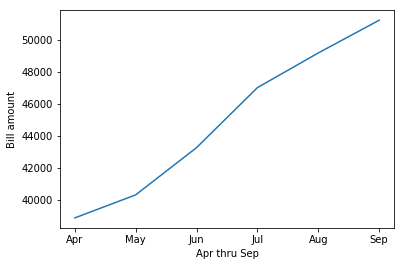

51223.3309
percent gain Apr to Sep:  0.3178


In [50]:
# get mean of each month bill amount, reverse the order 
b9 = df['BILL_AMT1'].mean()
b8 = df['BILL_AMT2'].mean()
b7 = df['BILL_AMT3'].mean()
b6 = df['BILL_AMT4'].mean()
b5 = df['BILL_AMT5'].mean()
b4 = df['BILL_AMT6'].mean()
plt.plot([b4,b5,b6,b7,b8,b9])
plt.xlabel('Apr thru Sep')
plt.ylabel('Bill amount')
_= plt.xticks(np.arange(6),('Apr','May','Jun','Jul','Aug','Sep'))
_= plt.yticks()
plt.show()
print(df['BILL_AMT1'].mean())
diff= (bill_amt_sep-bill_amt_apr)/bill_amt_apr
print('percent gain Apr to Sep: ', format(diff, '.4f'))


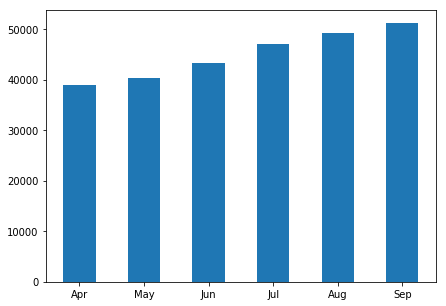

percent gain Apr to Sep:  0.3178


In [49]:
b9 = df['BILL_AMT1'].mean()
b8 = df['BILL_AMT2'].mean()
b7 = df['BILL_AMT3'].mean()
b6 = df['BILL_AMT4'].mean()
b5 = df['BILL_AMT5'].mean()
b4 = df['BILL_AMT6'].mean()
BillIncrease = pd.DataFrame()
BillIncrease[x]= ('b4','b5','b6','b7','b8','b9')
BillIncrease[y]= (b4,b5,b6,b7,b8,b9)
_= plt.figure(figsize=(7,5))
_= plt.bar(BillIncrease[x],BillIncrease[y],width=0.5)
_= plt.xticks(np.arange(6),('Apr','May','Jun','Jul','Aug','Sep'))
plt.show()

print('percent gain Apr to Sep: ', format(((b9-b4)/b4), '.4f'))